##### Copyright 2019 The TensorFlow Authors.

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# CycleGAN

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cyclegan"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This notebook demonstrates unpaired image to image translation using conditional GAN's, as described in [Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks](https://arxiv.org/abs/1703.10593), also known as CycleGAN. The paper proposes a method that can capture the characteristics of one image domain and figure out how these characteristics could be translated into another image domain, all in the absence of any paired training examples. 

This notebook assumes you are familiar with Pix2Pix, which you can learn about in the [Pix2Pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix). The code for CycleGAN is similar, the main difference is an additional loss function, and the use of unpaired training data.

CycleGAN uses a cycle consistency loss to enable training without the need for paired data. In other words, it can translate from one domain to another without a one-to-one mapping between the source and target domain. 

This opens up the possibility to do a lot of interesting tasks like photo-enhancement, image colorization, style transfer, etc. All you need is the source and the target dataset (which is simply a directory of images).

![Output Image 1](images/horse2zebra_1.png)
![Output Image 2](images/horse2zebra_2.png)

## Set up the input pipeline

Install the [tensorflow_examples](https://github.com/tensorflow/examples) package that enables importing of the generator and the discriminator.

In [2]:
!pip install -q git+https://github.com/tensorflow/examples.git

You should consider upgrading via the 'pip install --upgrade pip' command.


In [1]:
import tensorflow as tf
tf.__version__

'2.0.0'

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

tfds.disable_progress_bar()
AUTOTUNE = tf.data.experimental.AUTOTUNE

## Important: Sets up TF to not run out of GPU memory

In [3]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
# config.gpu_options.per_process_gpu_memory_fraction=0.5
session = InteractiveSession(config=config)

## Input Pipeline

This tutorial trains a model to translate from images of horses, to images of zebras. You can find this dataset and similar ones [here](https://www.tensorflow.org/datasets/datasets#cycle_gan). 

As mentioned in the [paper](https://arxiv.org/abs/1703.10593), apply random jittering and mirroring to the training dataset. These are some of the image augmentation techniques that avoids overfitting.

This is similar to what was done in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#load_the_dataset)

* In random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.
* In random mirroring, the image is randomly flipped horizontally i.e left to right.

In [4]:
# dataset, metadata = tfds.load('cycle_gan/horse2zebra',
#                               with_info=True, as_supervised=True)

# train_horses, train_zebras = dataset['trainA'], dataset['trainB']
# test_horses, test_zebras = dataset['testA'], dataset['testB']

In [5]:
PATH = "./input/cycletrain/"


def load_pair(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [6]:
def load_single(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    image = tf.cast(image, tf.float32)
    return image

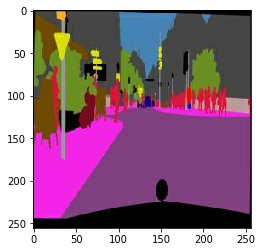

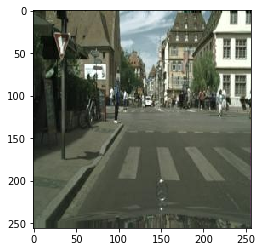

In [7]:
inp, re = load_pair(PATH+'train/2222.jpg')

# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [8]:
BUFFER_SIZE = 100
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [9]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

In [10]:
# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

In [11]:
def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

In [12]:
def preprocess_image_train(image, label=None):
  image = random_jitter(image)
  image = normalize(image)
  return image

In [13]:
def preprocess_image_test(image, label=None):
  image = normalize(image)
  return image

In [14]:
def load_image_train(image_path):
    image = load_single(image_path)
    return preprocess_image_train(image)

In [15]:
def load_image_test(image_path):
    image = load_single(image_path)
    return preprocess_image_test(image)

In [16]:
def load_pair(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)
  
  input_image = tf.image.resize(input_image, [IMG_HEIGHT, IMG_WIDTH],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [IMG_HEIGHT, IMG_WIDTH],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def load_pair_train(image_file):
  input_image, real_image = load_pair(image_file)
  return preprocess_image_train(input_image), preprocess_image_train(real_image)

def load_pair_test(image_file):
  input_image, real_image = load_pair(image_file)
  return preprocess_image_test(input_image), preprocess_image_test(real_image)

## Acquiring Labelled Data

In [17]:
train_dataset = tf.data.Dataset.list_files(PATH+'train/*.jpg')
train_dataset = train_dataset.map(load_pair_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.cache().shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(1)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

test_dataset = tf.data.Dataset.list_files(PATH+'test/*.jpg')
test_dataset = test_dataset.map(load_pair_test)
test_dataset = test_dataset.batch(1)

## Unlabelled Data

In [18]:
train_real_paths = tf.data.Dataset.list_files(PATH+'train_real/*.jpg')
train_mask_paths = tf.data.Dataset.list_files(PATH+'train_mask/*.jpg')
test_real_paths = tf.data.Dataset.list_files(PATH+'test_real/*.jpg')
test_mask_paths = tf.data.Dataset.list_files(PATH+'test_mask/*.jpg')

train_reals= train_real_paths.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE) \
                          .cache() \
                          .shuffle(BUFFER_SIZE) \
                          .batch(BATCH_SIZE)

test_reals= test_real_paths.map(load_image_test,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE) \
                          .shuffle(BUFFER_SIZE) \
                          .batch(BATCH_SIZE)


train_masks = train_mask_paths.map(
    load_image_train, num_parallel_calls=AUTOTUNE)\
.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_masks = test_mask_paths.map(
    load_image_test, num_parallel_calls=AUTOTUNE)\
.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [19]:
sample_real = next(iter(train_reals))
sample_mask = next(iter(train_masks))

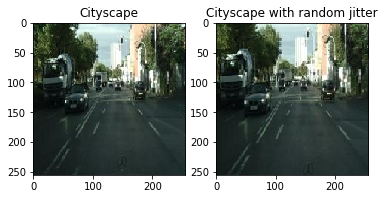

In [20]:
plt.subplot(121)
plt.title('Cityscape')
plt.imshow(sample_real[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Cityscape with random jitter')
plt.imshow(random_jitter(sample_real[0]) * 0.5 + 0.5)

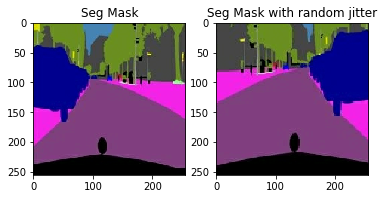

In [21]:
plt.subplot(121)
plt.title('Seg Mask')
plt.imshow(sample_mask[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Seg Mask with random jitter')
plt.imshow(random_jitter(sample_mask[0]) * 0.5 + 0.5)

## Import and reuse the Pix2Pix models

Import the generator and the discriminator used in [Pix2Pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py) via the installed [tensorflow_examples](https://github.com/tensorflow/examples) package.

The model architecture used in this tutorial is very similar to what was used in [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). Some of the differences are:

* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).
* The [CycleGAN paper](https://arxiv.org/abs/1703.10593) uses a modified `resnet` based generator. This tutorial is using a modified `unet` generator for simplicity.

There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here. 

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](images/cyclegan_model.png)

In [22]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

In [23]:
# discriminator_x.summary()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


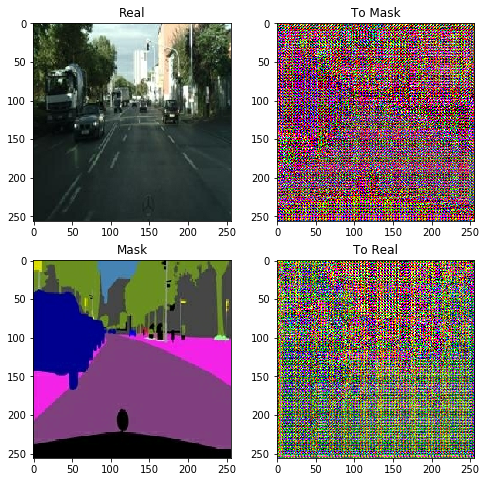

In [24]:
to_zebra = generator_g(sample_mask)
to_horse = generator_f(sample_real)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_real, to_zebra, sample_mask, to_horse]
title = ['Real', 'To Mask', 'Mask', 'To Real']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

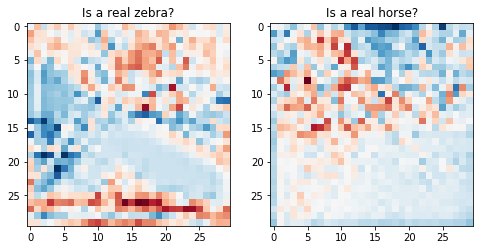

In [25]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real zebra?')
plt.imshow(discriminator_y(sample_mask)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real horse?')
plt.imshow(discriminator_x(sample_real)[0, ..., -1], cmap='RdBu_r')

plt.show()

## Loss functions

In CycleGAN, there is no paired data to train on, hence there is no guarantee that the input `x` and the target `y` pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.

The discriminator loss and the generator loss are similar to the ones used in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#define_the_loss_functions_and_the_optimizer).

In [26]:
LAMBDA = 10

In [27]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [28]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [29]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

Cycle consistency means the result should be close to the original input. For example, if one translates a sentence from English to French, and then translates it back from French to English, then the resulting sentence should be the same as the  original sentence.

In cycle consistency loss, 

* Image $X$ is passed via generator $G$ that yields generated image $\hat{Y}$.
* Generated image $\hat{Y}$ is passed via generator $F$ that yields cycled image $\hat{X}$.
* Mean absolute error is calculated between $X$ and $\hat{X}$.

$$forward\ cycle\ consistency\ loss: X -> G(X) -> F(G(X)) \sim \hat{X}$$

$$backward\ cycle\ consistency\ loss: Y -> F(Y) -> G(F(Y)) \sim \hat{Y}$$


![Cycle loss](images/cycle_loss.png)

In [30]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  
  return LAMBDA * loss1

As shown above, generator $G$ is responsible for translating image $X$ to image $Y$. Identity loss says that, if you fed image $Y$ to generator $G$, it should yield the real image $Y$ or something close to image $Y$.

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [31]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

Initialize the optimizers for all the generators and the discriminators.

In [32]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Supervised Losses

In [33]:
SUP_LAMBDA = 10

def supervised_discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_obj(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_obj(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

def supervised_generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_obj(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (SUP_LAMBDA * l1_loss)

  return total_gen_loss

In [34]:
# supervised_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
# supervised_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

supervised_generator_optimizer = generator_g_optimizer
supervised_discriminator_optimizer = discriminator_y_optimizer

## Checkpoints

In [35]:
checkpoint_path = "./checkpoints_cyclegan/train"

unsupervised_ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

unsupervised_ckpt_manager = tf.train.CheckpointManager(unsupervised_ckpt, checkpoint_path, max_to_keep=None)

# if a checkpoint exists, restore the latest checkpoint.
ckpt_number = 0
if unsupervised_ckpt_manager.latest_checkpoint:
    print("Found:", unsupervised_ckpt_manager.checkpoints[ckpt_number])
    unsupervised_ckpt.restore(unsupervised_ckpt_manager.checkpoints[ckpt_number])
    print ('Checkpoint {} restored!'.format(len(unsupervised_ckpt_manager.checkpoints)+ckpt_number+1))

Found: ./checkpoints_cyclegan/train/ckpt-1
Checkpoint 2 restored!


In [36]:
checkpoint_dir = './checkpoints_cyclegan/supervised_train'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=supervised_generator_optimizer,
                                 discriminator_optimizer=supervised_discriminator_optimizer,
                                 generator=generator_g,
                                 discriminator=discriminator_y)

sup_ckpt_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=None)
# if a checkpoint exists, restore the latest checkpoint.
if sup_ckpt_manager.latest_checkpoint:
  checkpoint.restore(sup_ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

In [37]:
# ckpt_save_path = ckpt_manager.save()
# checkpoint.save(file_prefix = checkpoint_prefix)

# print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))

In [38]:
!ls {checkpoint_path}

checkpoint		    ckpt-1.data-00001-of-00002
ckpt-1.data-00000-of-00002  ckpt-1.index


In [39]:
print(unsupervised_ckpt_manager.latest_checkpoint)

./checkpoints_cyclegan/train/ckpt-1


In [40]:
def generate_images(model, test_input):
  prediction = model(test_input)
    
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [41]:
def generate_image_pairs(model, test_input, tar):
  # the training=True is intentional here since
  # we want the batch statistics while running the model
  # on the test dataset. If we use training=False, we will get
  # the accumulated statistics learned from the training dataset
  # (which we don't want)
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

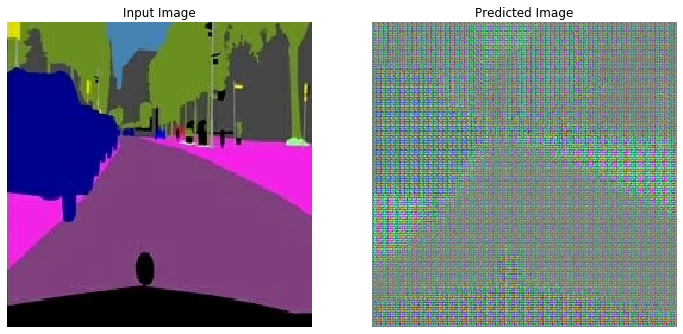

In [42]:
generate_images(generator_g, sample_mask)

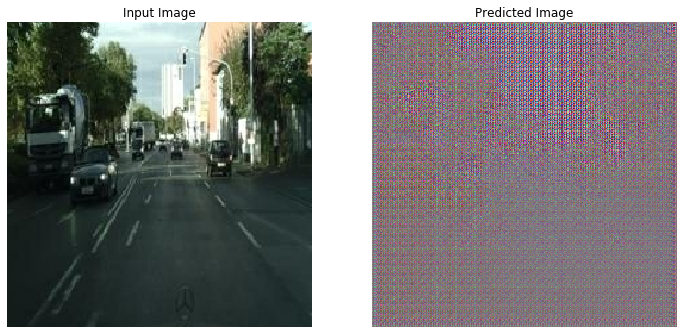

In [43]:
generate_images(generator_f, sample_real)


## Defining Training Steps

Note: This example model is trained for fewer epochs (40) than the paper (200) to keep training time reasonable for this tutorial. Predictions may be less accurate. 

Even though the training loop looks complicated, it consists of four basic steps:

* Get the predictions.
* Calculate the loss.
* Calculate the gradients using backpropagation.
* Apply the gradients to the optimizer.

In [44]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

## Training Generator G in a paired setting

In [45]:
@tf.function
def supervised_train_step(input_image, target):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator_g(input_image, training=True)

    disc_real_output = discriminator_y([input_image, target], training=True)
    disc_generated_output = discriminator_y([input_image, gen_output], training=True)
    
    gen_loss = supervised_generator_loss(disc_generated_output, gen_output, target)
    disc_loss = supervised_discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_loss,
                                          generator_g.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator_y.trainable_variables)

  supervised_generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator_g.trainable_variables))
  supervised_discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator_y.trainable_variables))

## The last example pair will be used to illustrate training performance

                              ---------- Initial Performance ----------


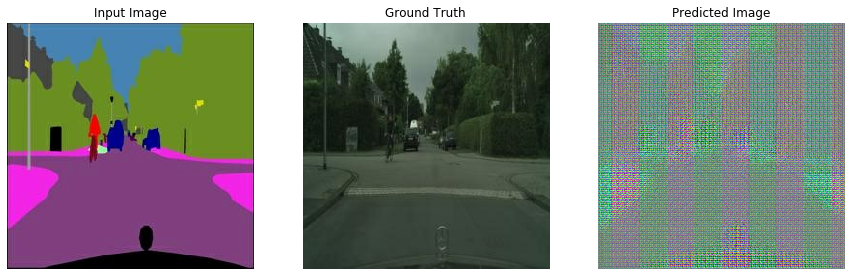

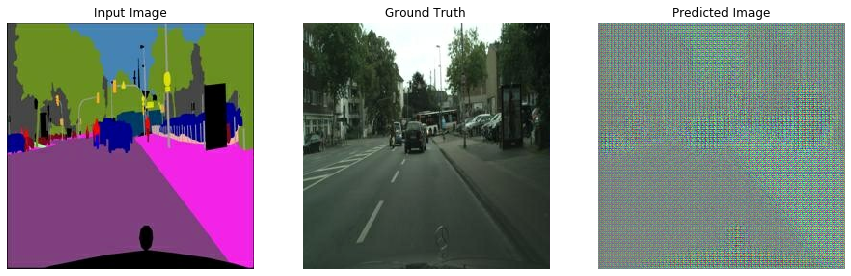

In [46]:
print(" "*30 + "---------- Initial Performance ----------")
# TODO: Add a subplot to combine all three images
for example_input, example_target in test_dataset.take(2):
    generate_image_pairs(generator_g, example_input, example_target)
# plt.savefig("mode_collapse.png")

> # Note that supervised training uses its own optimizer

In [47]:
from tensorflow.keras.utils import Progbar

EPOCHS = 20
SUPERVISED_EPOCHS = 1

1900/2000 [==============================================================================================>.....] - ETA: 49s 

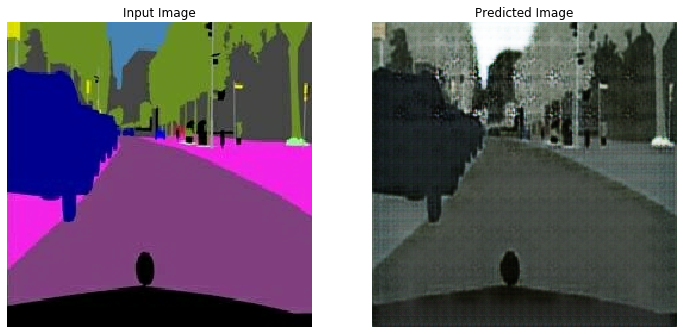

Saving checkpoint for epoch 1 at ./checkpoints_cyclegan/train/ckpt-2
Time taken for unsupervised epoch 1 is 983.6107814311981 sec

900/975 [===========================================================================================>........] - ETA: 7s 

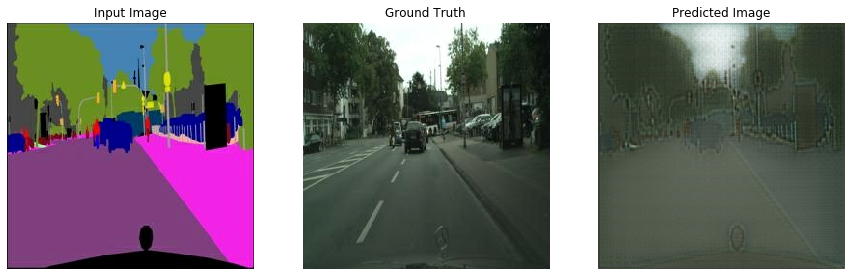

Saving checkpoint for epoch 1 at ./checkpoints_cyclegan/supervised_train/ckpt-1
Time taken for supervised epoch 1 is 97.61258625984192 sec

Total time for epoch 1 is 1081.223447561264 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

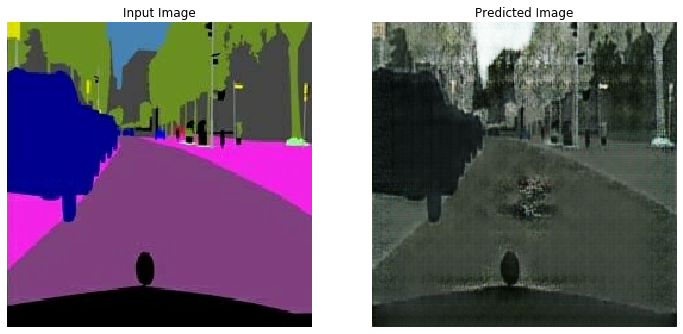

Saving checkpoint for epoch 2 at ./checkpoints_cyclegan/train/ckpt-3
Time taken for unsupervised epoch 2 is 967.9769048690796 sec

900/975 [===========================================================================================>........] - ETA: 7s 

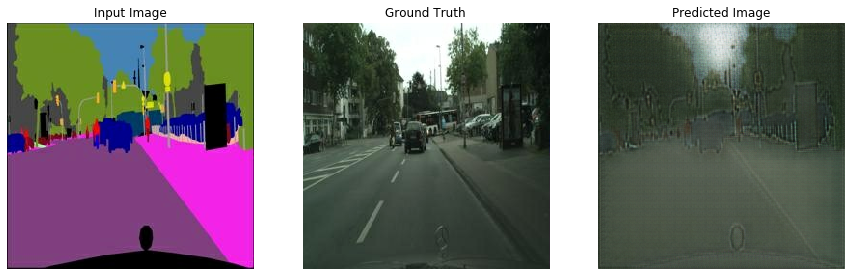

Saving checkpoint for epoch 2 at ./checkpoints_cyclegan/supervised_train/ckpt-2
Time taken for supervised epoch 2 is 95.3555006980896 sec

Total time for epoch 2 is 1063.3324377536774 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

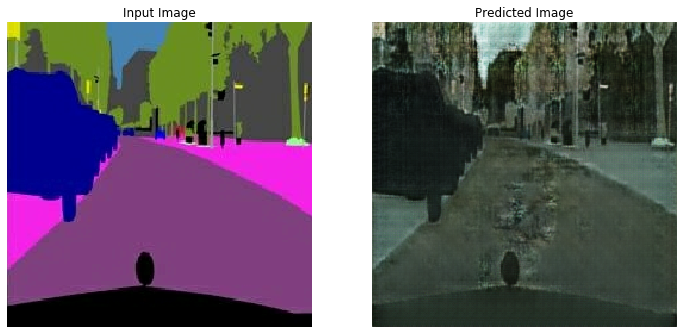

Saving checkpoint for epoch 3 at ./checkpoints_cyclegan/train/ckpt-4
Time taken for unsupervised epoch 3 is 967.8596465587616 sec

900/975 [===========================================================================================>........] - ETA: 7s 

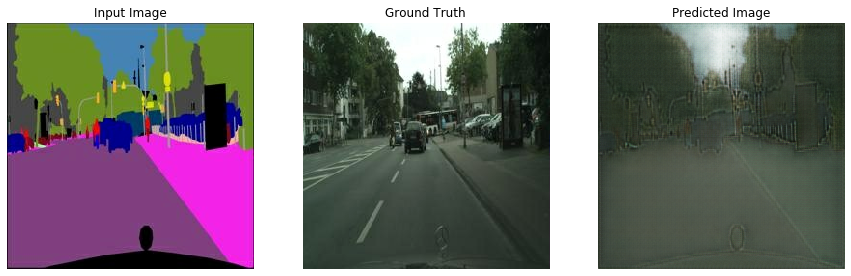

Saving checkpoint for epoch 3 at ./checkpoints_cyclegan/supervised_train/ckpt-3
Time taken for supervised epoch 3 is 95.36620235443115 sec

Total time for epoch 3 is 1063.2258849143982 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

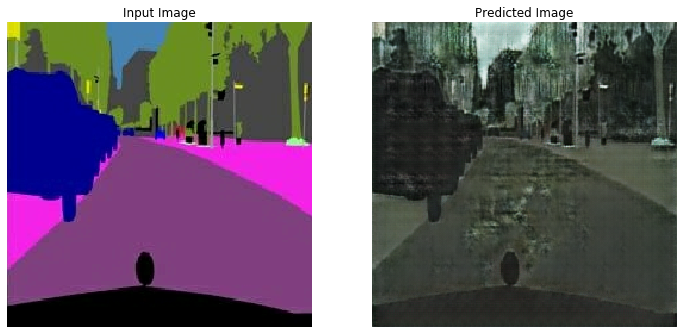

Saving checkpoint for epoch 4 at ./checkpoints_cyclegan/train/ckpt-5
Time taken for unsupervised epoch 4 is 967.999933719635 sec

900/975 [===========================================================================================>........] - ETA: 7s 

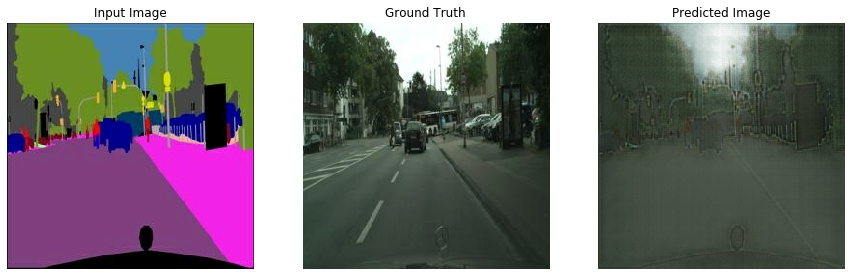

Saving checkpoint for epoch 4 at ./checkpoints_cyclegan/supervised_train/ckpt-4
Time taken for supervised epoch 4 is 95.422043800354 sec

Total time for epoch 4 is 1063.4221215248108 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

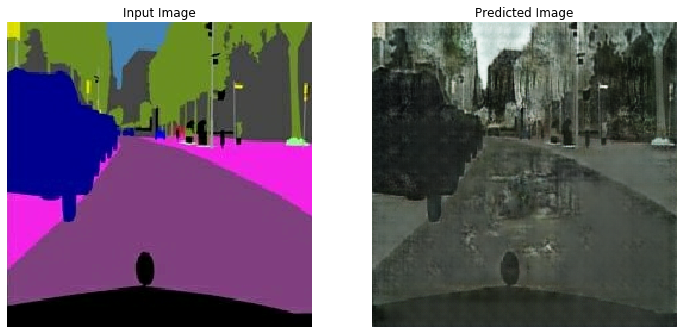

Saving checkpoint for epoch 5 at ./checkpoints_cyclegan/train/ckpt-6
Time taken for unsupervised epoch 5 is 968.4525074958801 sec

900/975 [===========================================================================================>........] - ETA: 7s 

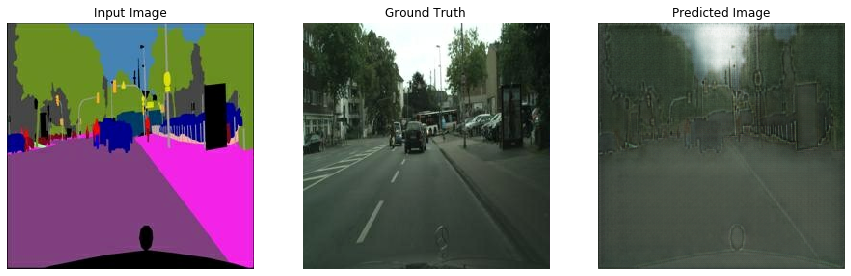

Saving checkpoint for epoch 5 at ./checkpoints_cyclegan/supervised_train/ckpt-5
Time taken for supervised epoch 5 is 95.69069623947144 sec

Total time for epoch 5 is 1064.1432967185974 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

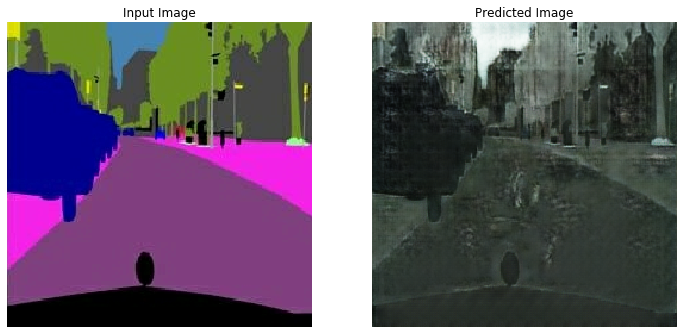

Saving checkpoint for epoch 6 at ./checkpoints_cyclegan/train/ckpt-7
Time taken for unsupervised epoch 6 is 967.9501338005066 sec

900/975 [===========================================================================================>........] - ETA: 7s 

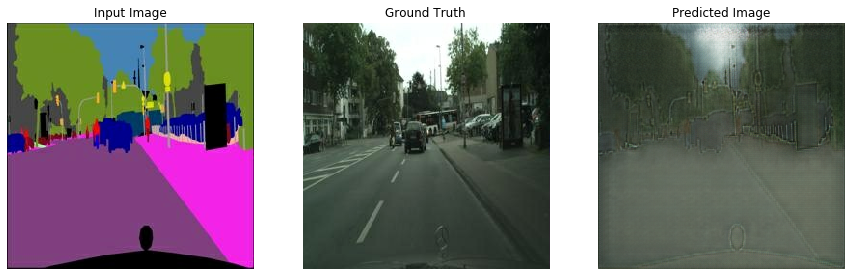

Saving checkpoint for epoch 6 at ./checkpoints_cyclegan/supervised_train/ckpt-6
Time taken for supervised epoch 6 is 95.3929193019867 sec

Total time for epoch 6 is 1063.343088388443 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

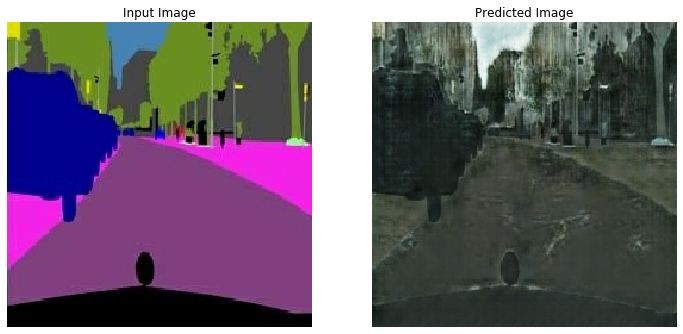

Saving checkpoint for epoch 7 at ./checkpoints_cyclegan/train/ckpt-8
Time taken for unsupervised epoch 7 is 968.0788900852203 sec

900/975 [===========================================================================================>........] - ETA: 7s 

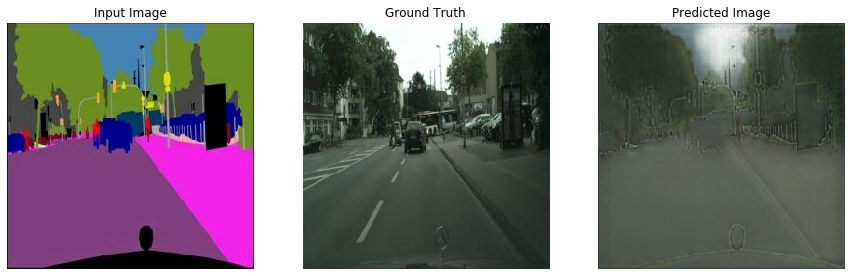

Saving checkpoint for epoch 7 at ./checkpoints_cyclegan/supervised_train/ckpt-7
Time taken for supervised epoch 7 is 95.45231699943542 sec

Total time for epoch 7 is 1063.5312416553497 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

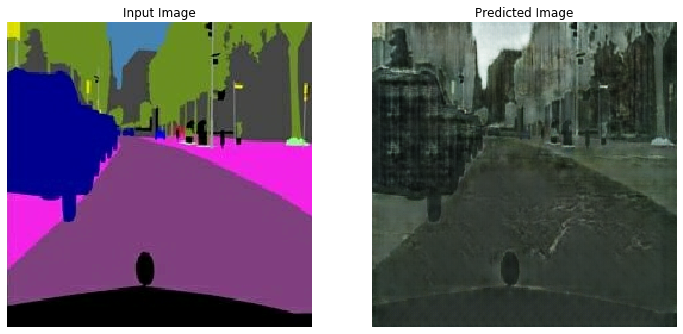

Saving checkpoint for epoch 8 at ./checkpoints_cyclegan/train/ckpt-9
Time taken for unsupervised epoch 8 is 968.1194448471069 sec

900/975 [===========================================================================================>........] - ETA: 7s 

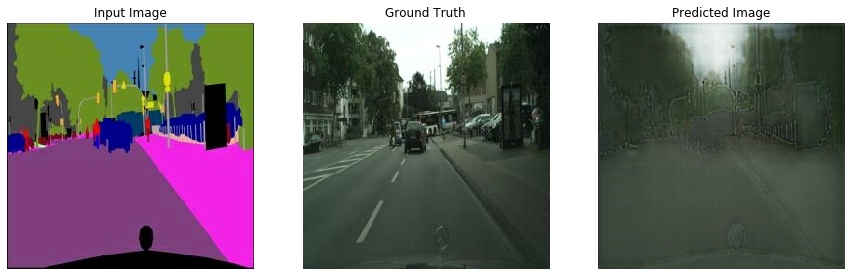

Saving checkpoint for epoch 8 at ./checkpoints_cyclegan/supervised_train/ckpt-8
Time taken for supervised epoch 8 is 95.42836499214172 sec

Total time for epoch 8 is 1063.5481548309326 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

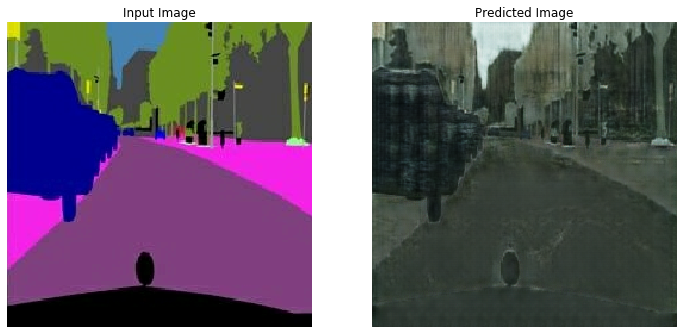

Saving checkpoint for epoch 9 at ./checkpoints_cyclegan/train/ckpt-10
Time taken for unsupervised epoch 9 is 967.9208943843842 sec

900/975 [===========================================================================================>........] - ETA: 7s 

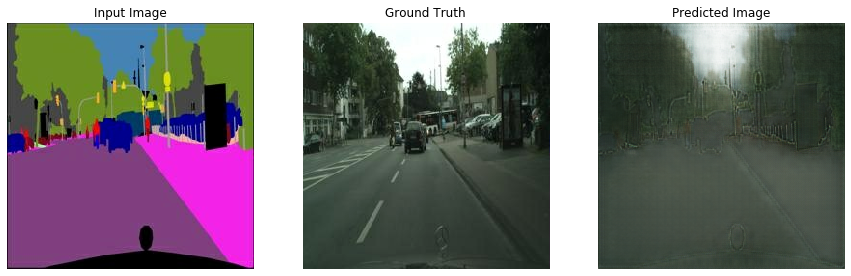

Saving checkpoint for epoch 9 at ./checkpoints_cyclegan/supervised_train/ckpt-9
Time taken for supervised epoch 9 is 95.32817888259888 sec

Total time for epoch 9 is 1063.2491064071655 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

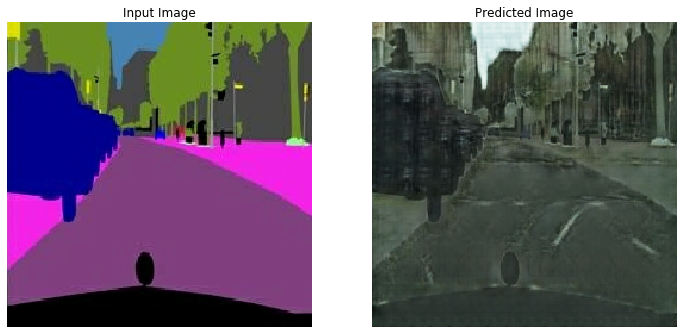

Saving checkpoint for epoch 10 at ./checkpoints_cyclegan/train/ckpt-11
Time taken for unsupervised epoch 10 is 967.6394512653351 sec

900/975 [===========================================================================================>........] - ETA: 7s 

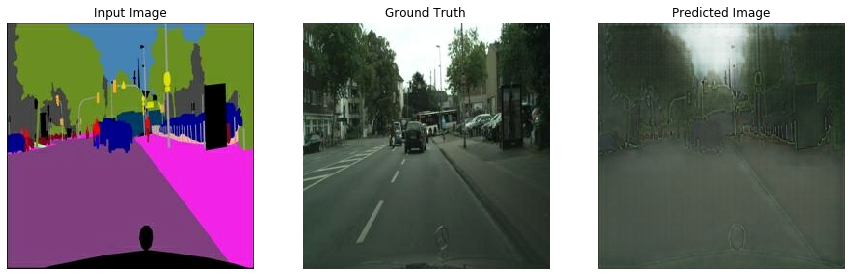

Saving checkpoint for epoch 10 at ./checkpoints_cyclegan/supervised_train/ckpt-10
Time taken for supervised epoch 10 is 95.36043429374695 sec

Total time for epoch 10 is 1063.0000267028809 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

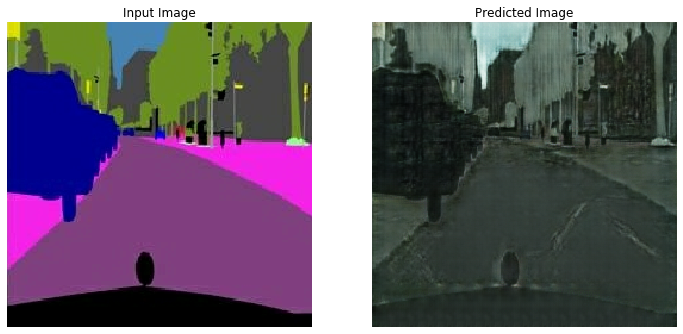

Saving checkpoint for epoch 11 at ./checkpoints_cyclegan/train/ckpt-12
Time taken for unsupervised epoch 11 is 967.713702917099 sec

900/975 [===========================================================================================>........] - ETA: 7s 

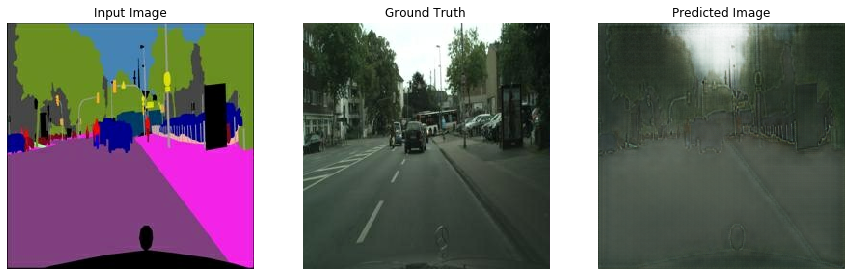

Saving checkpoint for epoch 11 at ./checkpoints_cyclegan/supervised_train/ckpt-11
Time taken for supervised epoch 11 is 95.40292239189148 sec

Total time for epoch 11 is 1063.1167147159576 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

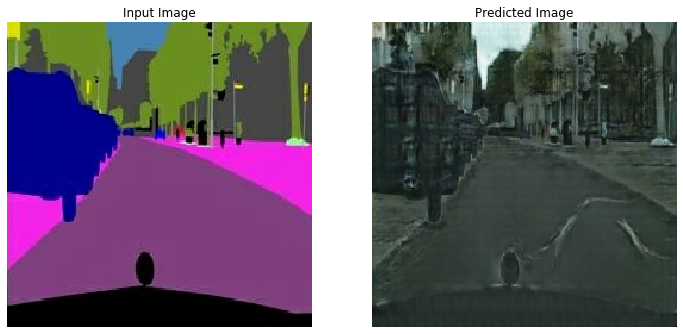

Saving checkpoint for epoch 12 at ./checkpoints_cyclegan/train/ckpt-13
Time taken for unsupervised epoch 12 is 967.7376418113708 sec

900/975 [===========================================================================================>........] - ETA: 7s 

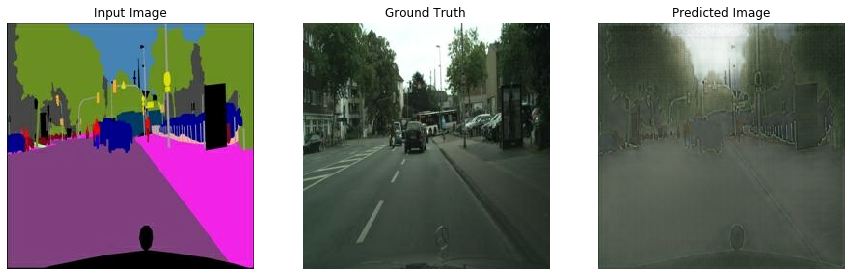

Saving checkpoint for epoch 12 at ./checkpoints_cyclegan/supervised_train/ckpt-12
Time taken for supervised epoch 12 is 95.39383625984192 sec

Total time for epoch 12 is 1063.1315195560455 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

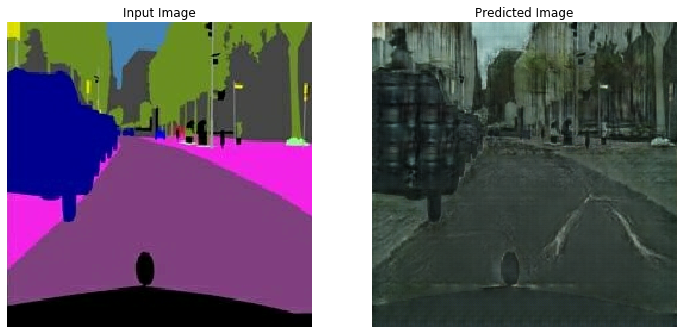

Saving checkpoint for epoch 13 at ./checkpoints_cyclegan/train/ckpt-14
Time taken for unsupervised epoch 13 is 967.9815912246704 sec

900/975 [===========================================================================================>........] - ETA: 7s 

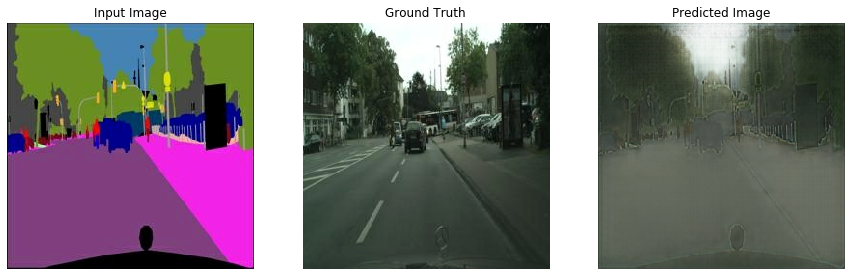

Saving checkpoint for epoch 13 at ./checkpoints_cyclegan/supervised_train/ckpt-13
Time taken for supervised epoch 13 is 95.32403516769409 sec

Total time for epoch 13 is 1063.305712223053 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

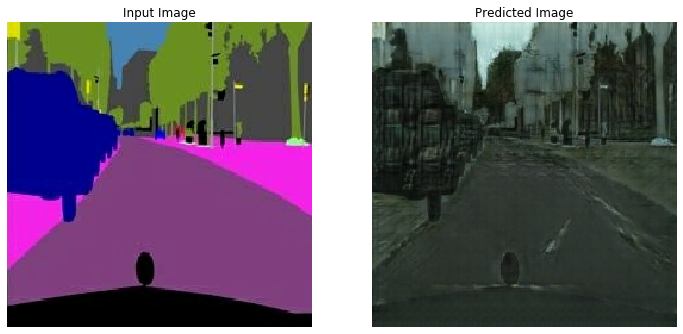

Saving checkpoint for epoch 14 at ./checkpoints_cyclegan/train/ckpt-15
Time taken for unsupervised epoch 14 is 967.8643321990967 sec

900/975 [===========================================================================================>........] - ETA: 7s 

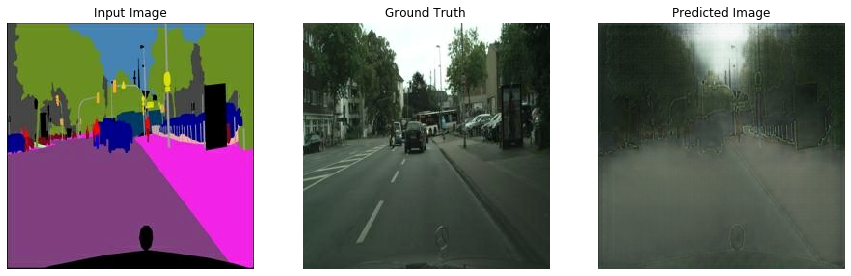

Saving checkpoint for epoch 14 at ./checkpoints_cyclegan/supervised_train/ckpt-14
Time taken for supervised epoch 14 is 95.32414245605469 sec

Total time for epoch 14 is 1063.1885092258453 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

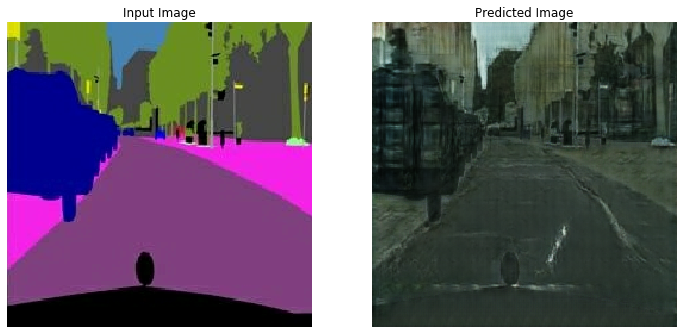

Saving checkpoint for epoch 15 at ./checkpoints_cyclegan/train/ckpt-16
Time taken for unsupervised epoch 15 is 967.9608900547028 sec

900/975 [===========================================================================================>........] - ETA: 7s 

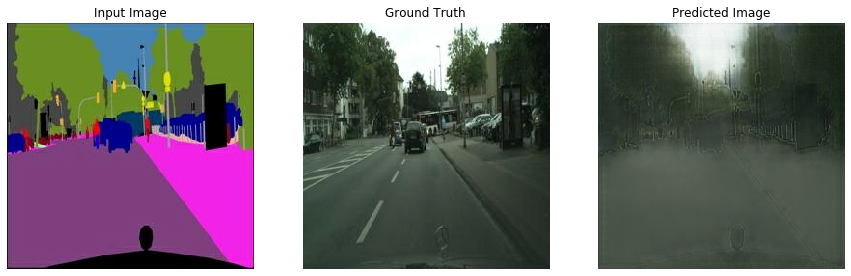

Saving checkpoint for epoch 15 at ./checkpoints_cyclegan/supervised_train/ckpt-15
Time taken for supervised epoch 15 is 95.34742546081543 sec

Total time for epoch 15 is 1063.308402299881 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

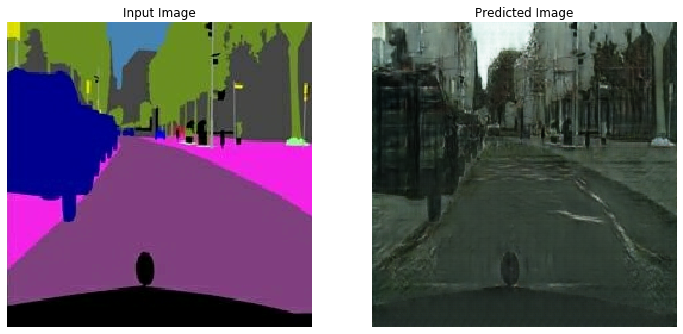

Saving checkpoint for epoch 16 at ./checkpoints_cyclegan/train/ckpt-17
Time taken for unsupervised epoch 16 is 968.3140451908112 sec

900/975 [===========================================================================================>........] - ETA: 7s 

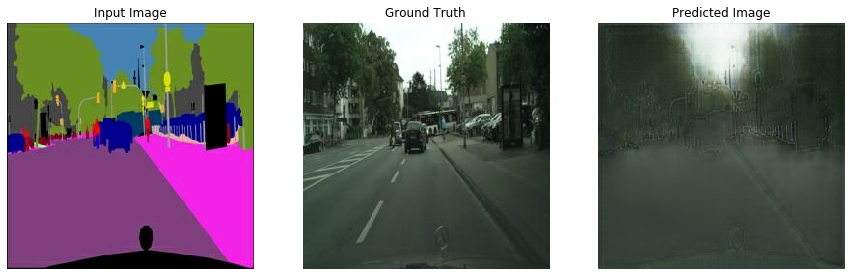

Saving checkpoint for epoch 16 at ./checkpoints_cyclegan/supervised_train/ckpt-16
Time taken for supervised epoch 16 is 95.36193251609802 sec

Total time for epoch 16 is 1063.6760761737823 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

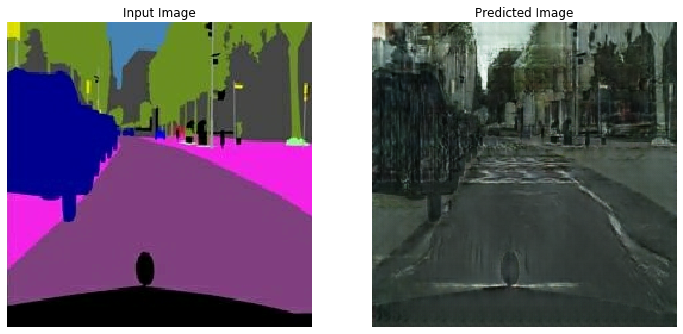

Saving checkpoint for epoch 17 at ./checkpoints_cyclegan/train/ckpt-18
Time taken for unsupervised epoch 17 is 967.9519021511078 sec

900/975 [===========================================================================================>........] - ETA: 7s 

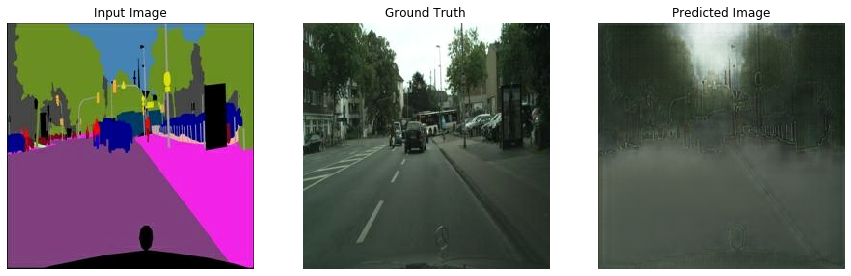

Saving checkpoint for epoch 17 at ./checkpoints_cyclegan/supervised_train/ckpt-17
Time taken for supervised epoch 17 is 95.4203143119812 sec

Total time for epoch 17 is 1063.3722560405731 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

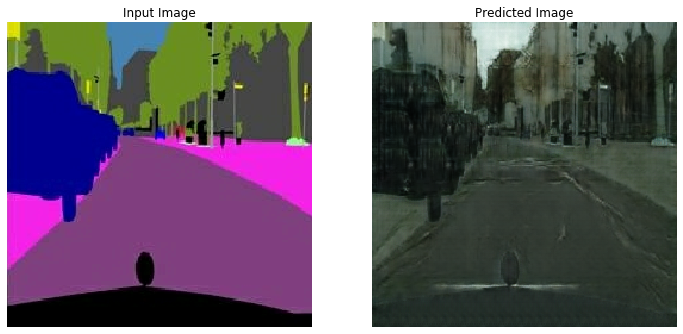

Saving checkpoint for epoch 18 at ./checkpoints_cyclegan/train/ckpt-19
Time taken for unsupervised epoch 18 is 967.4627857208252 sec

900/975 [===========================================================================================>........] - ETA: 7s 

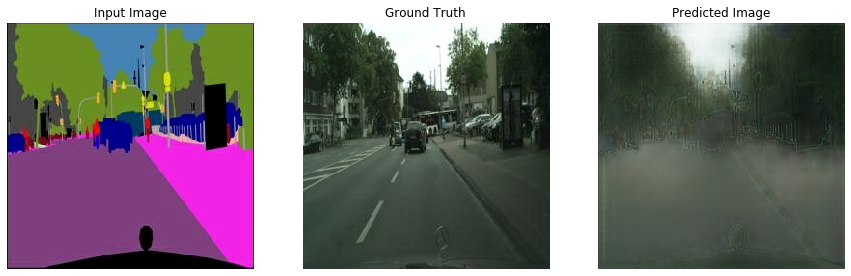

Saving checkpoint for epoch 18 at ./checkpoints_cyclegan/supervised_train/ckpt-18
Time taken for supervised epoch 18 is 95.30878329277039 sec

Total time for epoch 18 is 1062.771606206894 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

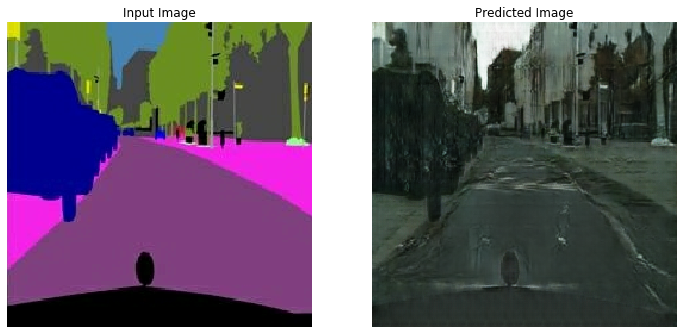

Saving checkpoint for epoch 19 at ./checkpoints_cyclegan/train/ckpt-20
Time taken for unsupervised epoch 19 is 967.8174242973328 sec

900/975 [===========================================================================================>........] - ETA: 7s 

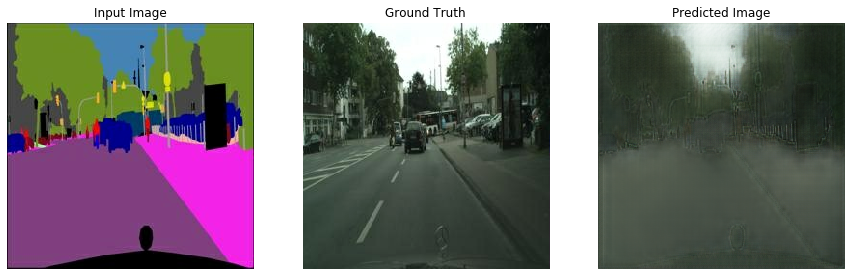

Saving checkpoint for epoch 19 at ./checkpoints_cyclegan/supervised_train/ckpt-19
Time taken for supervised epoch 19 is 95.56806945800781 sec

Total time for epoch 19 is 1063.3855831623077 sec

1900/2000 [==============================================================================================>.....] - ETA: 48s 

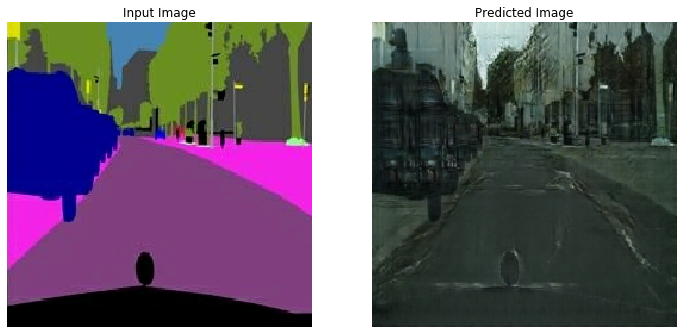

Saving checkpoint for epoch 20 at ./checkpoints_cyclegan/train/ckpt-21
Time taken for unsupervised epoch 20 is 968.5476098060608 sec

900/975 [===========================================================================================>........] - ETA: 7s 

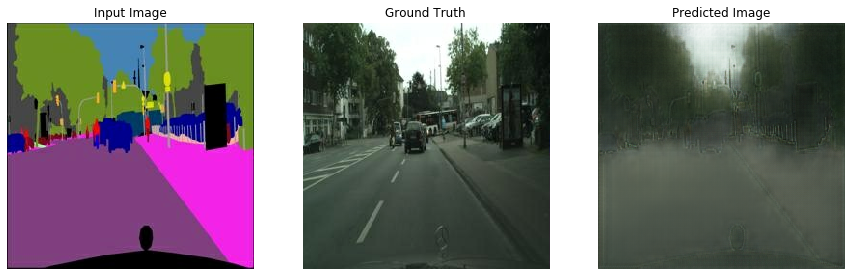

Saving checkpoint for epoch 20 at ./checkpoints_cyclegan/supervised_train/ckpt-20
Time taken for supervised epoch 20 is 95.45708656311035 sec

Total time for epoch 20 is 1064.0047481060028 sec

CPU times: user 3h 57min 52s, sys: 2h 3min 2s, total: 6h 54s
Wall time: 5h 54min 45s


In [48]:
%%time

for epoch in range(EPOCHS):
  start = time.time()

  unsup_progbar = Progbar(target=2000, width=100, unit_name="step")
  n = 0

  for image_x, image_y in tf.data.Dataset.zip((train_masks, train_reals)):
    train_step(image_x, image_y)
    if n % 100 == 0:
#       print ('=', end='')
      unsup_progbar.update(n)
    n+=1
    
#   clear_output(wait=True)
  # Using a consistent image (sample_horse) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_mask)

  if (epoch + 1) % 1 == 0:
    ckpt_save_path = unsupervised_ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for unsupervised epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))
  
  #Supervised Train
  SUPERVISED_EPOCHS = 1
  for epoch_ in range(SUPERVISED_EPOCHS):
    start_ = time.time()

    # Train
    sup_progbar = Progbar(target=975, width=100, unit_name="step")
    n_iter = 0
    for input_image, target in train_dataset:
      supervised_train_step(input_image, target)
      if n_iter % 100 == 0:
#         print ('=', end='')
        sup_progbar.update(n_iter)
      n_iter+=1
      

    generate_image_pairs(generator_g, example_input, example_target)

    # saving (checkpoint) the model every 10 epochs
    if (epoch + 1) % 1 == 0:
      ckpt_save_path = sup_ckpt_manager.save()
      print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

    print ('Time taken for supervised epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start_))
  print ('Total time for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

## Generate using test dataset

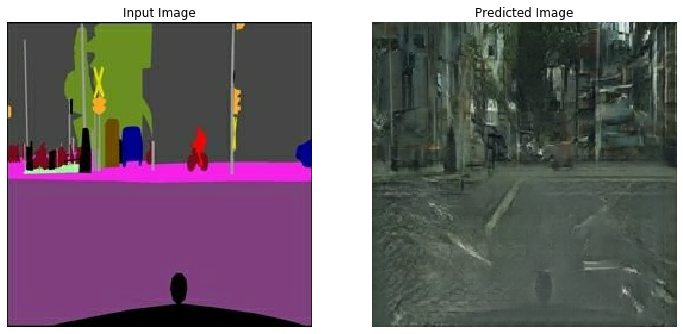

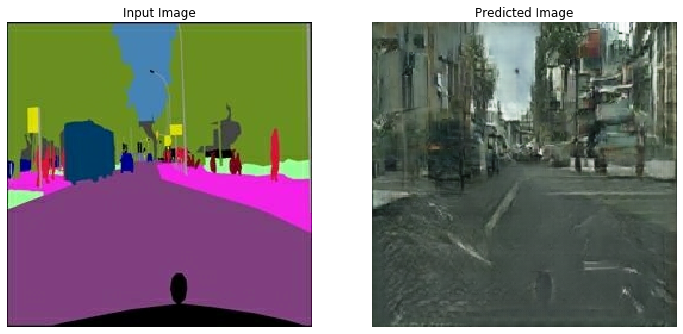

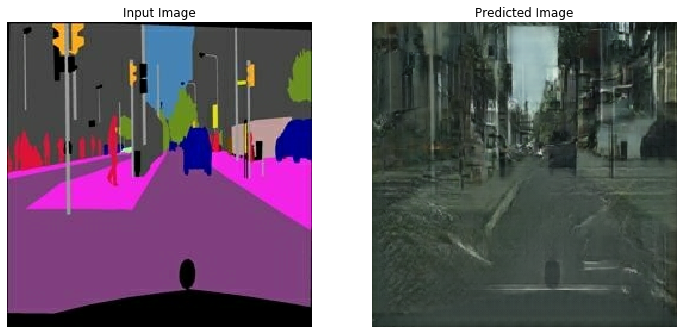

CPU times: user 832 ms, sys: 15.8 ms, total: 848 ms
Wall time: 766 ms


In [42]:
%%time
# Run the trained model on the test dataset
for inp in test_masks.take(3):
  generate_images(generator_g, inp)

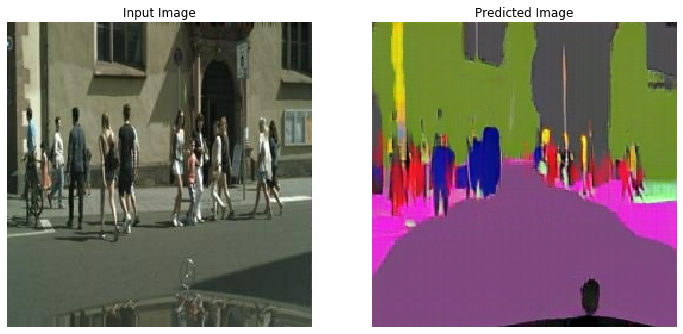

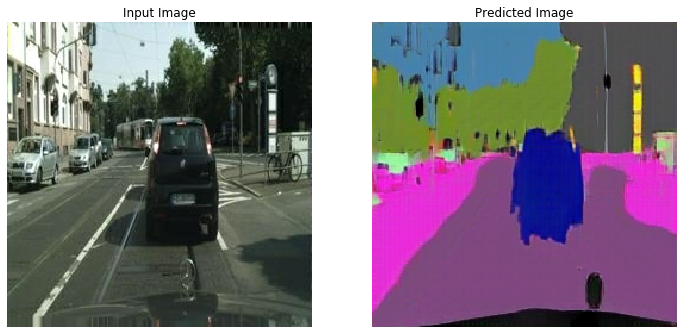

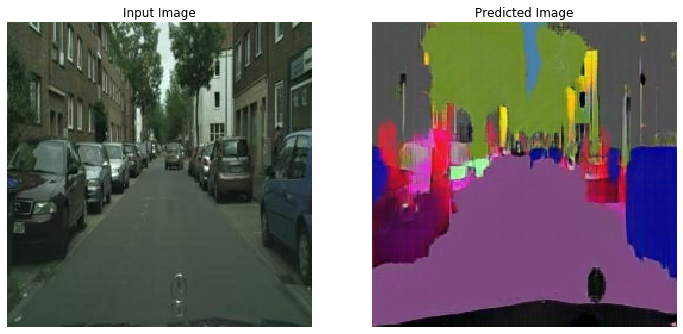

CPU times: user 911 ms, sys: 14.1 ms, total: 925 ms
Wall time: 827 ms


In [41]:
%%time
# Run the trained model on the test dataset
for inp in test_reals.take(3):
  generate_images(generator_f, inp)